<h1 align="center">CAMM Hackathon - Session 1</h1>
<p align="left"><em>26 September 2025</em></p>

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/KBForgeX/camm_hackathon/blob/k4my4r/docs/regressors/CAMM_Hackathon_1.ipynb)




**Data provenance** : The dataset aggregates measurements from a Dy–Er–Gd–Ho oxide wafer study in the CAMM by the Rack and Page groups


<h3>Goal: Feature → Target Prediction</h3>


This notebook hands you a **clean, standardized dataset** and a minimal prep pipeline so you can build your own predictive models. Your goal is to use the provided **features** (materials/structure descriptors) to **predict a target property** (default: *Thermal Conductivity*). The notebook **stops at data preparation**—you will implement and compare models (e.g., linear models, trees, neural nets) using the prepared data.

**What you’ll find here**
- A tidy table with `x`, `y` wafer coordinates and a set of engineered features (numeric, aligned to the same grid, with units harmonized).
- A simple example showing how to **select a target and features**, coerce to numeric, handle missing values (median imputation), and standardize inputs—ready for modeling.
- You can swap the target and feature lists to explore different prediction tasks.

**What you will do**
- Choose a **target** (e.g., `Thermal Conductivity`) and a subset of **features** you think are predictive.
- Train any models you like (sklearn, PyTorch, etc.) on the **prepared arrays**.
- Report basic metrics (RMSE, MAE, $R^2$) and, if useful, visualize predictions on the wafer grid using `x`, `y`.


#Data Preparation

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [ ]:
!gdown --fuzzy https://drive.google.com/file/d/1BSZ3YyTw6dqELnL9qpfV8V5wVrbA-BPz/view?usp=sharing

Downloading...
From: https://drive.google.com/uc?id=1BSZ3YyTw6dqELnL9qpfV8V5wVrbA-BPz
To: /content/ReZrO_data.csv
100% 513k/513k [00:00<00:00, 41.6MB/s]


In [ ]:
path = "/content/ReZrO_data.csv"   # update if path differs
df = pd.read_csv(path)

Let's see what all properties we have in the dataset

In [ ]:
print("Dataframe shape:", df.shape)
display(df.head())


Dataframe shape: (2601, 17)


,x,y,Thermal Conductivity,Lattice Parameter(WPF),delta_d(SPF-WPF),d-spacing(WPF),Fluorite Size Disorder,Entropy,strain(LMFIT-dspacing),a111(LMFIT),a200(LMFIT),mismatch(LMFIT-lattice parameter),d111(LMFIT),d200(LMFIT),corr_length,fwhm111(LMFIT),delta_d/d
0,-2.5,-2.5,0.668247,5.245110,0.020399,2.622555,0.103832,3.924187,0.127131,5.245331,5.286782,-0.007902,3.028393,2.643391,2.94866,0.097076,0.007778
1,-2.5,-2.4,0.651635,5.245110,0.020399,2.622555,0.103727,3.927794,0.127131,5.245331,5.286782,-0.007902,3.028393,2.643391,2.94866,0.097076,0.007778
2,-2.5,-2.3,0.661063,5.244901,0.019877,2.622450,0.103588,3.939862,0.127240,5.245438,5.286226,-0.007776,3.028455,2.643113,2.94866,0.096367,0.007580
3,-2.5,-2.2,0.594712,5.244901,0.019877,2.622450,0.103447,3.951859,0.127240,5.245438,5.286226,-0.007776,3.028455,2.643113,2.94866,0.096367,0.007580
4,-2.5,-2.1,0.620809,5.244680,0.019664,2.622340,0.103338,3.955091,0.127249,5.245217,5.285954,-0.007766,3.028328,2.642977,2.94866,0.095942,0.007499


Let's plot them and see how they look

### Feature Definitions

1. **Lattice Parameter (WPF)**  
   Calculated by fitting the **whole XRD spectrum** using **TOPAS**.

2. **d-spacing (WPF)**  
   Average d-spacing calculated from fitting all peaks.

3. **Δd (SPF–WPF)**  
   Difference between *d-spacing (200 peak)* (2nd XRD peak) and *d-spacing (WPF)*:  
   $$ \Delta d = d_{WPF} - d_{\text{SPF}} $$

4. **delta_d/d**  
   Strain calculated from (2) and (3):  
   $$ \frac{\Delta d}{d} = \frac{d_{WPF} - d_{\text{SPF}}}{d_{\text{WPF}}} $$

5. **a111 (LMFit)**  
   Lattice parameter from fitting the **111 peak** (1st XRD peak) using the **LMFit** package.

6. **a200 (LMFit)**  
   Lattice parameter from fitting the **200 peak** (2nd XRD peak) using **LMFit**.

7. **Mismatch (LMFit – lattice parameter)**  
   $$ \text{Mismatch} = \frac{a_{111} - a_{200}}{a_{111}} $$

8. **d111 (LMFit)**  
   d-spacing of the 111 peak from LMFit.

9. **d200 (LMFit)**  
   d-spacing of the 200 peak from LMFit.

10. **Correlation Length**  
    Calculated from AFM images.

11. **FWHM111 (LMFit)**  
    Full Width at Half Maximum of the **111 peak**.

12. **Strain (LMFit – d-spacing)**  
    Strain calculated using LMFit d-spacing values:  
    $$ \frac{\Delta d}{d}{LMFIT} = \frac{d_{111} - d_{200}}{d_{111}} $$


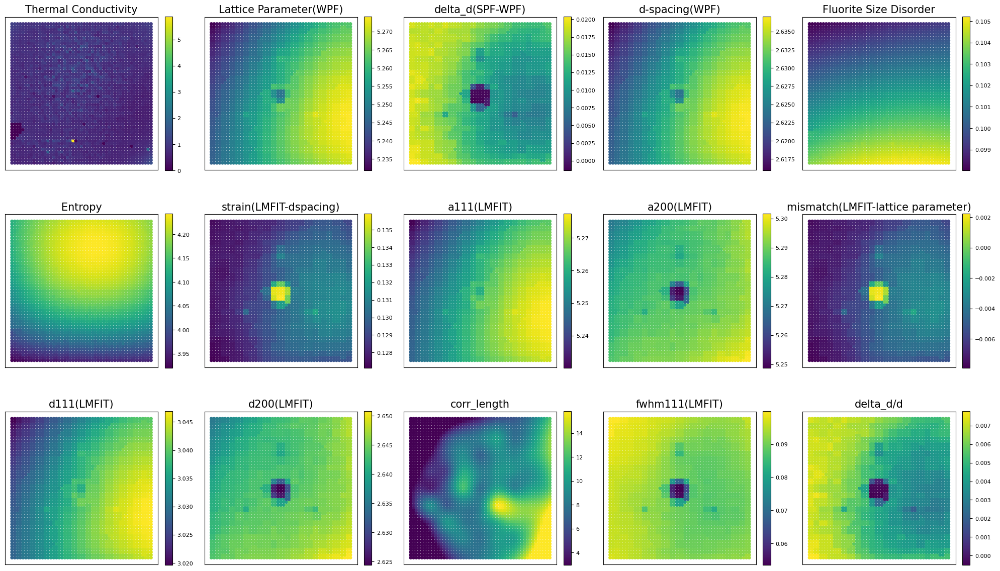

In [ ]:
x = df["x"].to_numpy()
y = df["y"].to_numpy()

feature_cols = [c for c in df.columns if c not in ["x", "y"]]

fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

for ax, col in zip(axes, feature_cols):
    z = pd.to_numeric(df[col], errors="coerce").to_numpy()
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(z)

    sc = ax.scatter(x[mask], y[mask], c=z[mask], s=16, cmap="viridis")
    ax.set_title(col, fontsize=15)
    ax.set_aspect("equal", "box")
    ax.set_xticks([]); ax.set_yticks([])

    # colorbar for each subplot
    cbar = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=8)

# Hide any unused subplots
for ax in axes[len(feature_cols):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

# How to use this to train in networks?

In [ ]:
features = [
    'a111(LMFIT)', 'mismatch(LMFIT-lattice parameter)',
    'Fluorite Size Disorder', 'Entropy',
    'corr_length',
]
target = 'Thermal Conductivity'

missing = [c for c in features + [target] if c not in df.columns]
if missing:
    raise KeyError(f"These columns are missing in df: {missing}")

In [ ]:
for c in features + [target]:
    df[c] = pd.to_numeric(df[c], errors="coerce")

# 3) drop rows with missing target
df_clean = df.dropna(subset=[target]).copy()

# 4) build matrices
X_raw = df_clean[features].to_numpy(dtype=np.float32) # Input features
y_raw = df_clean[target].to_numpy(dtype=np.float32)[:, None] #Target feature that needs to be predicted
XY    = df_clean[["x","y"]].to_numpy(dtype=np.float32) if set(["x","y"]).issubset(df_clean.columns) else None # can be used to plot predictions back on the grid


In [ ]:
X_train_raw, X_val_raw, y_train, y_val, XY_train, XY_val = train_test_split(
    X_raw, y_raw, XY, test_size=0.2, random_state=42
)
# Use this to split into training and testing dataset

We split the dataset into training and test sets because we want to test our model on unseen data

## Build your network now

Make use of Chatgpt and build your own network to predict one of the features you select

In [ ]:
!pip install numpy pandas matplotlib scikit-learn

Using 2601 samples and 47 features.
x,y present: wafer plots + local features enabled.

=== Metrics (sorted by val R2) ===
           Model  train_R2   train_RMSE    train_MAE   val_R2  val_RMSE  val_MAE
GradientBoosting  0.735922 1.184762e-01 8.095041e-02 0.395970  0.131756 0.091820
    RandomForest  0.912372 6.824754e-02 3.772849e-02 0.344568  0.137248 0.094705
             KNN  1.000000 2.642971e-07 4.932451e-08 0.309951  0.140826 0.094991
         XGBoost  0.991895 2.075539e-02 1.574338e-02 0.309514  0.140870 0.098569
             MLP  0.428396 1.743061e-01 9.855978e-02 0.296208  0.142221 0.099253


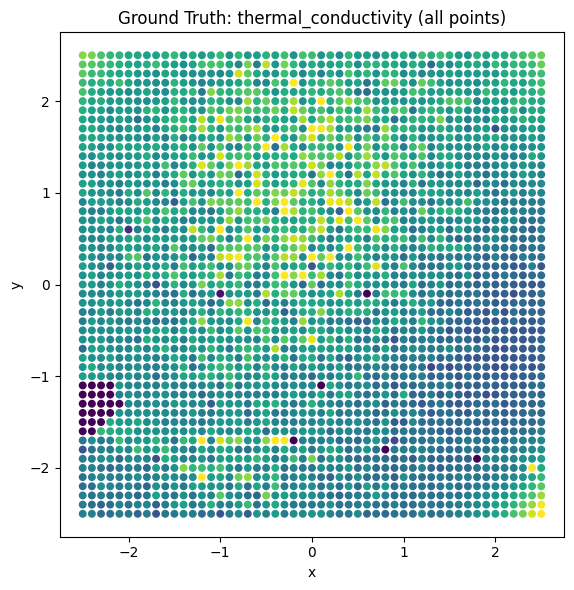

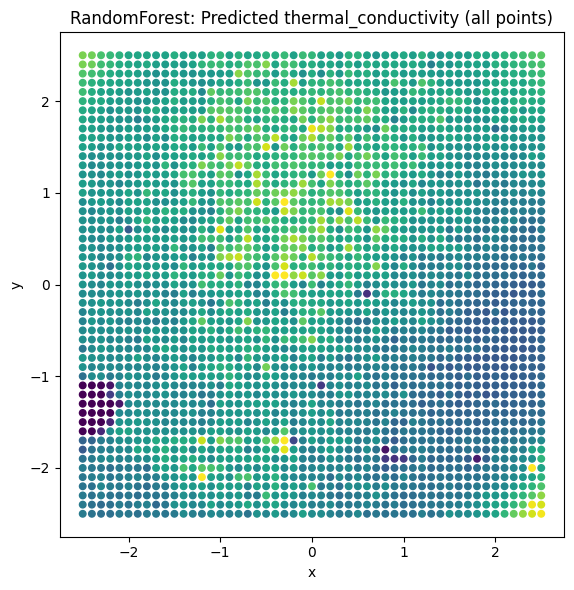

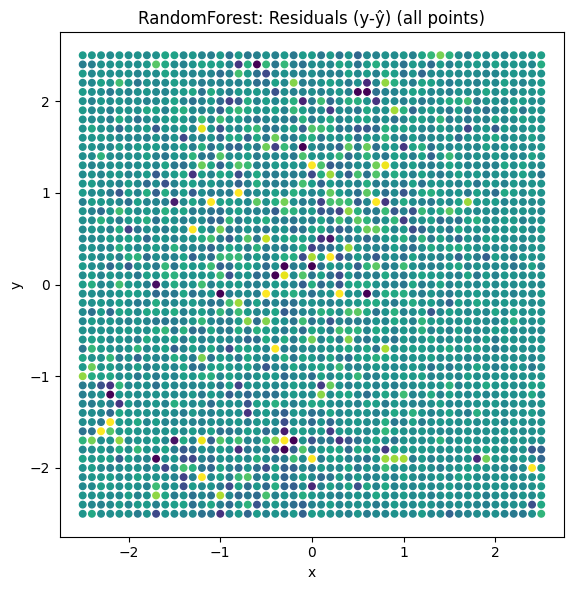

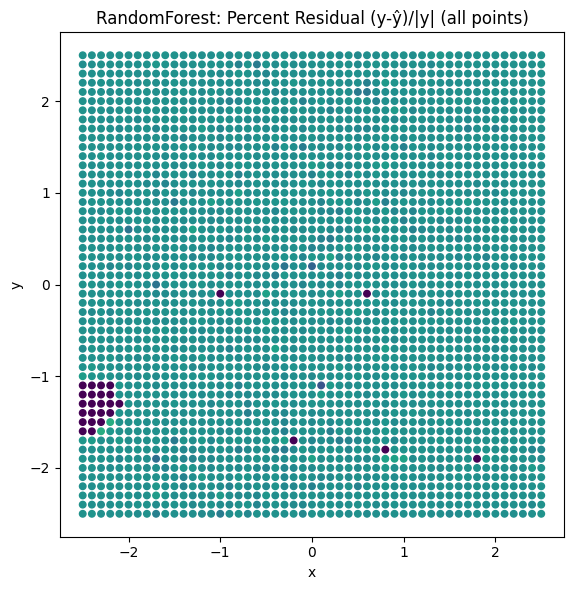

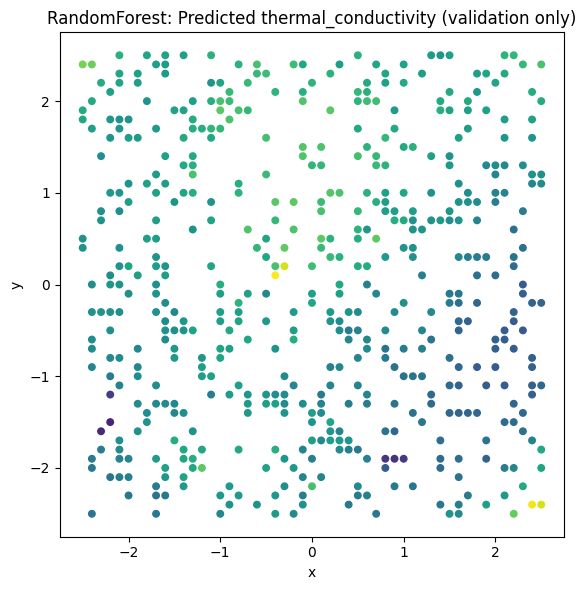

...

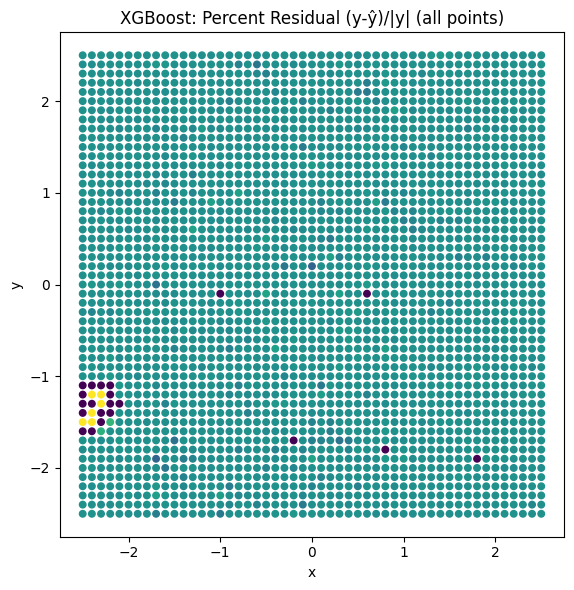

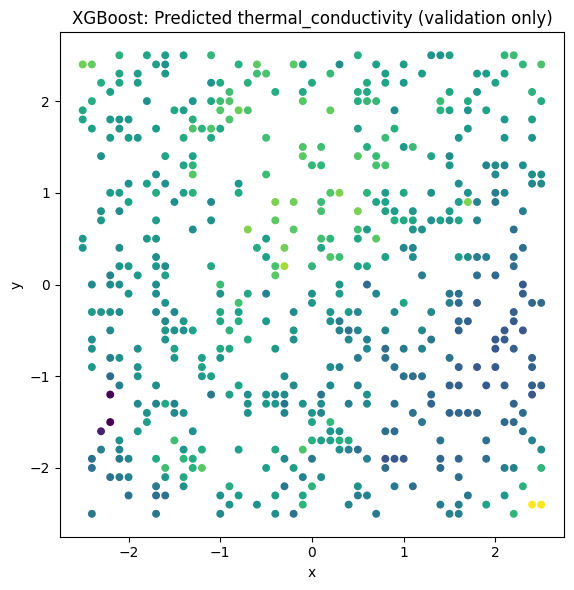

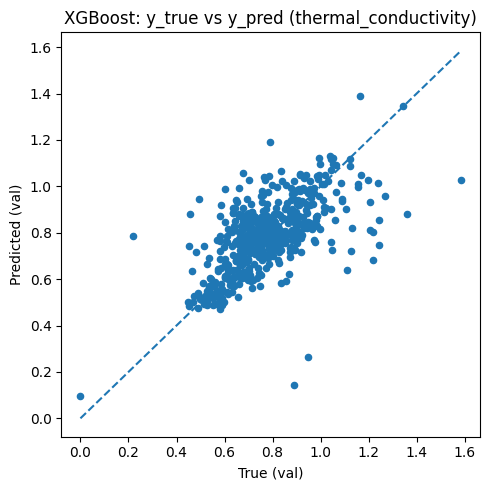

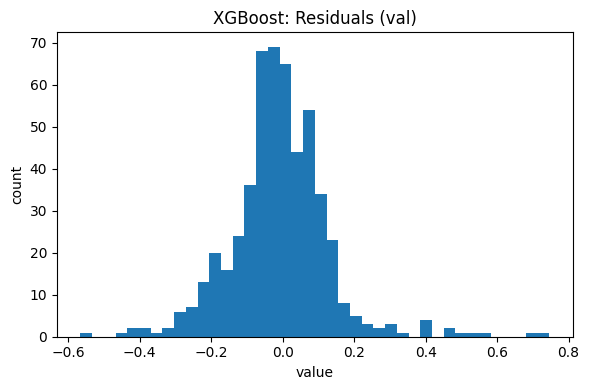

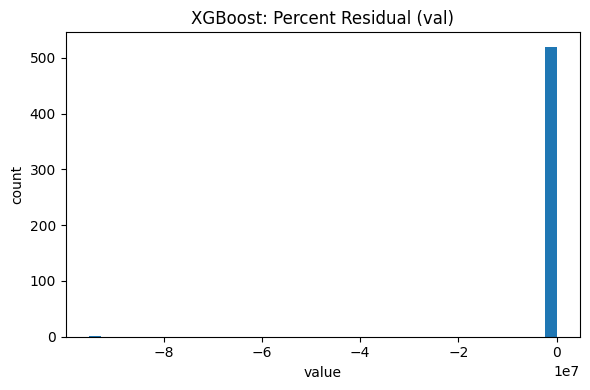


Saved: model_metrics.csv and all plots (.png) in current directory.


In [ ]:
# === CAMM Hackathon: Full modeling + diagnostics (all models, engineered + local features) ===
# deps: numpy, pandas, matplotlib, scikit-learn  (optional: xgboost)
import os, re, json, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from difflib import get_close_matches
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor

# Optional: XGBoost if available
try:
    from xgboost import XGBRegressor
    HAS_XGB = True
except Exception:
    HAS_XGB = False

# -----------------------------
# Config
# -----------------------------
DATA_PATH = "ReZrO_data.csv"  # change if needed
TARGET_ALIASES = ["thermal conductivity", "thermalconductivity", "k", "thermal_cond"]

# Canonical feature names
canonical_map = {
    "latticeparameter_wpf": ["lattice parameter (wpf)"],
    "dspacing_wpf": ["d-spacing (wpf)", "d spacing (wpf)"],
    "delta_d_spf_wpf": ["Δd (spf–wpf)", "delta d (spf-wpf)", "delta_d (spf-wpf)"],
    "delta_d_over_d": ["delta_d/d", "Δd/d", "delta d over d"],
    "a111_lmfit": ["a111 (lmfit)"],
    "a200_lmfit": ["a200 (lmfit)"],
    "mismatch_lmfit_latticeparameter": [
        "mismatch (lmfit – lattice parameter)",
        "mismatch (lmfit - lattice parameter)",
    ],
    "d111_lmfit": ["d111 (lmfit)"],
    "d200_lmfit": ["d200 (lmfit)"],
    "correlationlength": ["correlation length", "corr_length", "corrlength"],
    "fwhm111_lmfit": ["fwhm111 (lmfit)", "fwhm 111 (lmfit)"],
    "strain_lmfit_dspacing": ["strain (lmfit – d-spacing)", "strain (lmfit - d-spacing)"],
}

def normalize_name(s: str) -> str:
    s = s.strip().lower()
    s = s.replace("–", "-").replace("—", "-").replace("−", "-")
    s = re.sub(r"[^a-z0-9]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s

# alias->canonical
alias_to_canon = {}
for canon, aliases in canonical_map.items():
    for a in aliases:
        alias_to_canon[normalize_name(a)] = canon

def resolve_columns(df_cols):
    norm_cols = {c: normalize_name(c) for c in df_cols}
    resolved = {}
    canon_keys = list(canonical_map.keys())
    canon_aliases = list(alias_to_canon.keys())
    for orig, norm in norm_cols.items():
        if norm in canon_keys:
            resolved[orig] = norm
            continue
        if norm in alias_to_canon:
            resolved[orig] = alias_to_canon[norm]
            continue
        cand = get_close_matches(norm, canon_aliases, n=1, cutoff=0.86)
        if cand:
            resolved[orig] = alias_to_canon[cand[0]]
    return resolved

def pick_target(df_orig, target_aliases=TARGET_ALIASES):
    names_norm = {normalize_name(c): c for c in df_orig.columns}
    for t in target_aliases:
        tn = normalize_name(t)
        if tn in names_norm:
            return names_norm[tn]
    for t in target_aliases:
        tn = normalize_name(t)
        match = get_close_matches(tn, list(names_norm.keys()), n=1, cutoff=0.8)
        if match:
            return names_norm[match[0]]
    return None

def metrics(y_true, y_pred):
    return dict(
        R2=float(r2_score(y_true, y_pred)),
        RMSE=float(np.sqrt(mean_squared_error(y_true, y_pred))),
        MAE=float(mean_absolute_error(y_true, y_pred))
    )

def plot_grid(xy, values, title, vmin=None, vmax=None, outpath=None):
    plt.figure(figsize=(6,6))
    plt.scatter(xy[:,0], xy[:,1], c=values, s=22, vmin=vmin, vmax=vmax)
    plt.gca().set_aspect("equal", "box")
    plt.xlabel("x"); plt.ylabel("y")
    plt.title(title)
    plt.tight_layout()
    if outpath: plt.savefig(outpath, dpi=160)
    plt.show()

def plot_hist(values, title, outpath=None, bins=40):
    plt.figure(figsize=(6,4))
    plt.hist(values, bins=bins)
    plt.xlabel("value"); plt.ylabel("count")
    plt.title(title)
    plt.tight_layout()
    if outpath: plt.savefig(outpath, dpi=160)
    plt.show()

# -----------------------------
# Load & canonicalize
# -----------------------------
if not os.path.exists(DATA_PATH):
    raise FileNotFoundError(f"CSV not found at: {DATA_PATH}")

df = pd.read_csv(DATA_PATH)
df_canon = df.copy()
col_resolution = resolve_columns(df.columns)
for orig, canon in col_resolution.items():
    df_canon[canon] = pd.to_numeric(df_canon[orig], errors="coerce")

# Target
target_orig = pick_target(df)
if target_orig is None:
    raise KeyError("Target not found (e.g., 'Thermal Conductivity', 'k'). Set TARGET_ALIASES or specify column.")
target_norm = normalize_name(target_orig)
df_canon[target_norm] = pd.to_numeric(df[target_orig], errors="coerce")

# Ensure XY present (for wafer plots & local features)
if not {"x","y"}.issubset(df.columns):
    print("Warning: x,y not found; wafer/local features disabled.")
    HAS_XY = False
    XY = None
else:
    HAS_XY = True
    df_canon["x"] = pd.to_numeric(df["x"], errors="coerce")
    df_canon["y"] = pd.to_numeric(df["y"], errors="coerce")

# -----------------------------
# Engineer features (safe, no leakage)
# -----------------------------
# Recompute robust versions if missing
if "a111_lmfit" in df_canon and "a200_lmfit" in df_canon:
    df_canon["mismatch_lmfit_latticeparameter_calc"] = (
        (df_canon["a111_lmfit"] - df_canon["a200_lmfit"]) / df_canon["a111_lmfit"]
    )

if "d111_lmfit" in df_canon and "d200_lmfit" in df_canon:
    df_canon["strain_lmfit_dspacing_calc"] = (
        (df_canon["d111_lmfit"] - df_canon["d200_lmfit"]) / df_canon["d111_lmfit"]
    )

# If WPF Δd is present, derive dspacing_spf and a robust delta_d_over_d
if {"dspacing_wpf","delta_d_spf_wpf"}.issubset(df_canon.columns):
    dspf = df_canon["dspacing_wpf"] - df_canon["delta_d_spf_wpf"]
    df_canon["delta_d_over_d_calc"] = (df_canon["dspacing_wpf"] - dspf) / df_canon["dspacing_wpf"]

# Candidate base features (use those that exist)
base_feats = [
    "a111_lmfit","a200_lmfit","d111_lmfit","d200_lmfit",
    "latticeparameter_wpf","dspacing_wpf","delta_d_spf_wpf","delta_d_over_d",
    "correlationlength","fwhm111_lmfit","strain_lmfit_dspacing","mismatch_lmfit_latticeparameter",
    # computed redundancies (if originals missing or noisy)
    "mismatch_lmfit_latticeparameter_calc","strain_lmfit_dspacing_calc","delta_d_over_d_calc"
]
present_base = [c for c in base_feats if c in df_canon.columns]

# Local spatial features (no target leakage): neighbor means/vars of selected predictors
local_feats = []
if HAS_XY:
    from sklearn.neighbors import NearestNeighbors
    k_local = 8  # adjust if needed
    valid_mask = np.isfinite(df_canon[["x","y"] + present_base].to_numpy(dtype=float)).all(axis=1)
    # compute on valid rows only to avoid NaNs propagating
    XY_all = df_canon.loc[valid_mask, ["x","y"]].to_numpy(dtype=float)
    nbrs = NearestNeighbors(n_neighbors=min(k_local, max(2, XY_all.shape[0]-1)), algorithm="kd_tree").fit(XY_all)
    idxs = np.arange(len(df_canon))
    # prefill locals with NaN
    for f in present_base:
        df_canon[f"_nbmean_{f}"] = np.nan
        df_canon[f"_nbvar_{f}"]  = np.nan
        local_feats += [f"_nbmean_{f}", f"_nbvar_{f}"]
    # fill neighbor stats
    valid_indices = idxs[valid_mask]
    for row_i, df_i in enumerate(valid_indices):
        # query neighbors for this valid row
        distances, inds = nbrs.kneighbors(XY_all[row_i:row_i+1], return_distance=True)
        nn = valid_indices[inds[0]]
        for f in present_base:
            vals = df_canon.loc[nn, f].to_numpy(dtype=float)
            vals = vals[np.isfinite(vals)]
            if vals.size:
                df_canon.at[df_i, f"_nbmean_{f}"] = float(vals.mean())
                df_canon.at[df_i, f"_nbvar_{f}"]  = float(vals.var())

# Final feature list
feature_cols = present_base + ([c for c in local_feats if c in df_canon.columns] if HAS_XY else [])
# Add raw XY as features (helps capture global gradients)
if HAS_XY:
    feature_cols += ["x","y"]

# Drop rows lacking target or all features
for c in feature_cols + [target_norm]:
    df_canon[c] = pd.to_numeric(df_canon[c], errors="coerce")

df_model = df_canon.dropna(subset=[target_norm]).copy()
# keep only rows with at least some features
df_model = df_model.dropna(subset=feature_cols, how="all").copy()

X = df_model[feature_cols].to_numpy(dtype=np.float32)
y = df_model[target_norm].to_numpy(dtype=np.float32)
XY = df_model[["x","y"]].to_numpy(dtype=np.float32) if HAS_XY else None

print(f"Using {X.shape[0]} samples and {X.shape[1]} features.")

# -----------------------------
# One consistent split
# -----------------------------
idx_all = np.arange(len(X))
idx_trn, idx_val = train_test_split(idx_all, test_size=0.2, random_state=42)
X_trn, X_val = X[idx_trn], X[idx_val]
y_trn, y_val = y[idx_trn], y[idx_val]
if HAS_XY:
    XY_trn, XY_val = XY[idx_trn], XY[idx_val]

# -----------------------------
# Models
# -----------------------------
model_specs = [
    ("RandomForest", RandomForestRegressor(n_estimators=500, random_state=42)),
    ("GradientBoosting", GradientBoostingRegressor(random_state=42)),
    ("KNN", KNeighborsRegressor(n_neighbors=15, weights="distance")),
    ("MLP",  # small NN
     None)  # placeholder; we build with scaling below
]
if HAS_XY:
    print("x,y present: wafer plots + local features enabled.")
if HAS_XGB:
    model_specs.append(("XGBoost",
        XGBRegressor(
            n_estimators=600, max_depth=6, learning_rate=0.05, subsample=0.8, colsample_bytree=0.8,
            reg_lambda=1.0, random_state=42, tree_method="hist", n_jobs=0
        )
    ))
else:
    print("xgboost not available; skipping XGBoost model.")

results = []
for name, model in model_specs:
    if name == "MLP":
        from sklearn.neural_network import MLPRegressor
        pipe = Pipeline([
            ("impute", SimpleImputer(strategy="median")),
            ("scale", StandardScaler()),
            ("model", MLPRegressor(hidden_layer_sizes=(128,64), activation="relu",
                                   solver="adam", alpha=1e-3, learning_rate_init=1e-3,
                                   max_iter=800, early_stopping=True, n_iter_no_change=30,
                                   validation_fraction=0.1, random_state=42))
        ])
    else:
        pipe = Pipeline([
            ("impute", SimpleImputer(strategy="median")),
            ("scale", StandardScaler() if name in {"MLP","KNN","GradientBoosting"} else "passthrough"),
            ("model", model)
        ])
    pipe.fit(X_trn, y_trn)
    y_hat_trn = pipe.predict(X_trn)
    y_hat_val = pipe.predict(X_val)
    res = {
        "name": name,
        "pipe": pipe,
        "train": metrics(y_trn, y_hat_trn),
        "val": metrics(y_val, y_hat_val),
        "y_hat_val": y_hat_val
    }
    results.append(res)

# -----------------------------
# Metrics table
# -----------------------------
metrics_rows = []
for r in results:
    row = {"Model": r["name"]}
    row.update({f"train_{k}": v for k,v in r["train"].items()})
    row.update({f"val_{k}": v for k,v in r["val"].items()})
    metrics_rows.append(row)
mdf = pd.DataFrame(metrics_rows).sort_values("val_R2", ascending=False)
print("\n=== Metrics (sorted by val R2) ===")
print(mdf.to_string(index=False))

# -----------------------------
# Shared scales for plots
# -----------------------------
y_vmin = np.nanpercentile(y, 1)
y_vmax = np.nanpercentile(y, 99)
resid_lim = np.nanpercentile(np.abs(y - np.nanmedian(y)), 99)  # symmetric residual scale hint

# -----------------------------
# Plot suite for ALL MODELS
# -----------------------------
def percent_residual(y_true, y_pred, eps=1e-9):
    return (y_true - y_pred) / (np.maximum(np.abs(y_true), eps))

# Ground truth wafer (all points)
if HAS_XY:
    plot_grid(XY, y, f"Ground Truth: {target_norm} (all points)", vmin=y_vmin, vmax=y_vmax, outpath=f"GT_{target_norm}_all.png")

for r in results:
    name, pipe = r["name"], r["pipe"]

    # Predictions
    y_hat_all = pipe.predict(X)
    resid_all = y - y_hat_all
    pres_all  = percent_residual(y, y_hat_all)

    # Wafer: predicted ALL
    if HAS_XY:
        plot_grid(XY, y_hat_all, f"{name}: Predicted {target_norm} (all points)", vmin=y_vmin, vmax=y_vmax, outpath=f"{name}_pred_all.png")
        # Wafer: residuals ALL (symmetric scale around 0)
        rmax = float(np.nanpercentile(np.abs(resid_all), 99))
        plot_grid(XY, resid_all, f"{name}: Residuals (y-ŷ) (all points)", vmin=-rmax, vmax=+rmax, outpath=f"{name}_resid_all.png")
        # Wafer: % residuals ALL
        pmax = float(np.nanpercentile(np.abs(pres_all), 99))
        plot_grid(XY, pres_all, f"{name}: Percent Residual (y-ŷ)/|y| (all points)", vmin=-pmax, vmax=+pmax, outpath=f"{name}_presid_all.png")

    # Validation-only
    y_hat_val = r["y_hat_val"]
    resid_val = y_val - y_hat_val
    pres_val  = percent_residual(y_val, y_hat_val)

    if HAS_XY:
        plot_grid(XY_val, y_hat_val, f"{name}: Predicted {target_norm} (validation only)", vmin=y_vmin, vmax=y_vmax, outpath=f"{name}_pred_val.png")

    # y_true vs y_pred (validation)
    plt.figure(figsize=(5,5))
    plt.scatter(y_val, y_hat_val, s=20)
    mn, mx = float(np.nanmin([y_val, y_hat_val])), float(np.nanmax([y_val, y_hat_val]))
    plt.plot([mn, mx], [mn, mx], linestyle="--")
    plt.xlabel("True (val)"); plt.ylabel("Predicted (val)")
    plt.title(f"{name}: y_true vs y_pred ({target_norm})")
    plt.tight_layout(); plt.savefig(f"{name}_ytrue_ypred.png", dpi=160); plt.show()

    # Residual histograms (val)
    plot_hist(resid_val, f"{name}: Residuals (val)", outpath=f"{name}_hist_resid.png")
    plot_hist(pres_val,  f"{name}: Percent Residual (val)", outpath=f"{name}_hist_presid.png")

# Optional: save metrics
mdf.to_csv("model_metrics.csv", index=False)
print("\nSaved: model_metrics.csv and all plots (.png) in current directory.")


In [ ]:
!pip install shap

Top features by mean(|SHAP|) in log-target space:
 1. fluorite_size_disorder: 0.028247
 2. y: 0.018602
 3. latticeparameter_wpf: 0.011877
 4. entropy: 0.011566
 5. corr_length: 0.0108
 6. x: 0.01059
 7. dspacing_wpf: 0.0069938
 8. a200_lmfit: 0.0069124
 9. fwhm111_lmfit: 0.006313
10. delta_d_spf_wpf: 0.004134
11. a111_lmfit: 0.0037685
12. strain_lmfit_dspacing: 0.0032094
13. d200_lmfit: 0.001418
14. d111_lmfit: 0.0012806
15. delta_d_over_d: 0.0012726
16. mismatch_lmfit_latticeparameter: 0.0012541


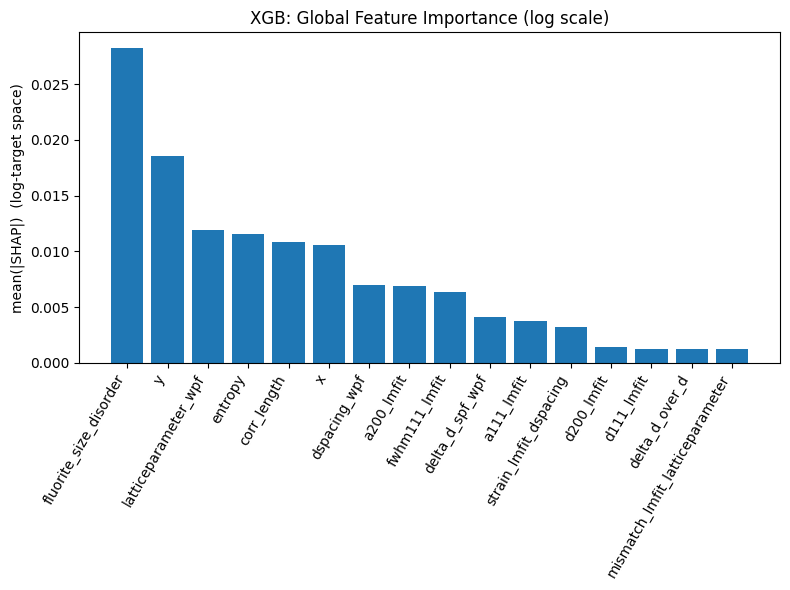

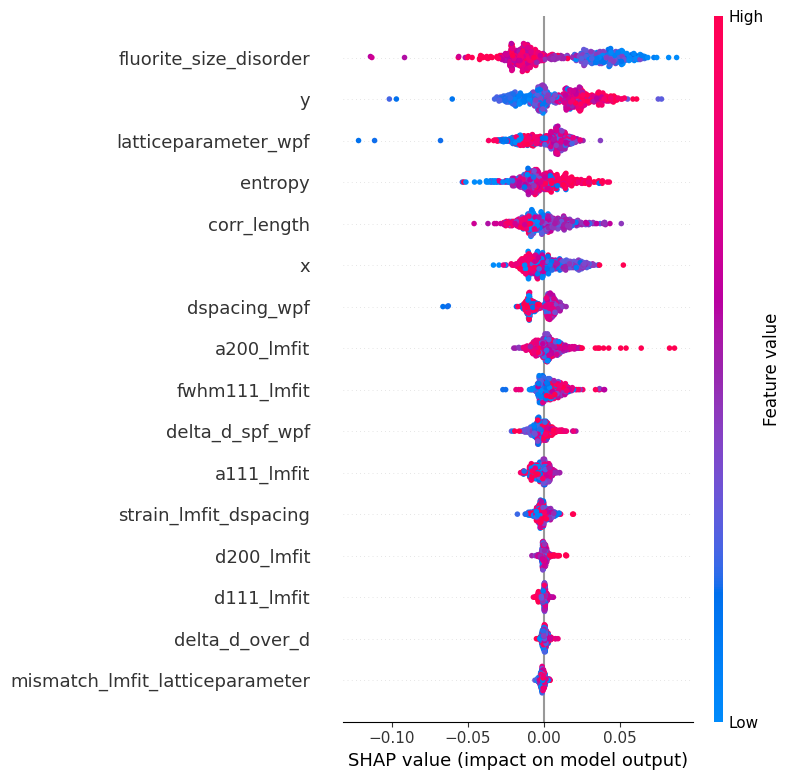

<Figure size 640x480 with 0 Axes>

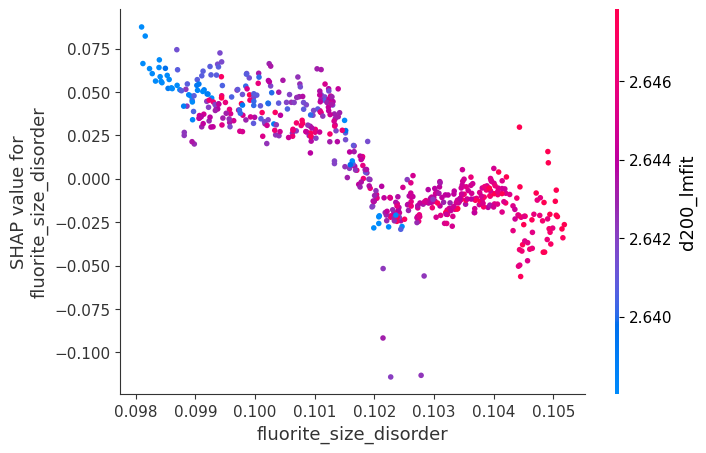

<Figure size 640x480 with 0 Axes>

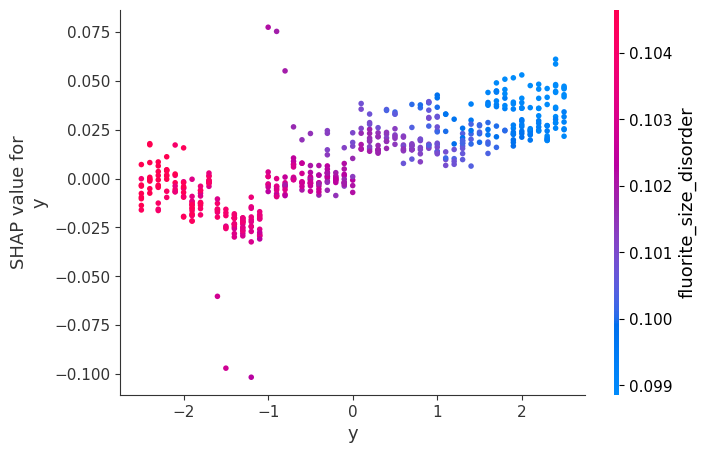

<Figure size 640x480 with 0 Axes>

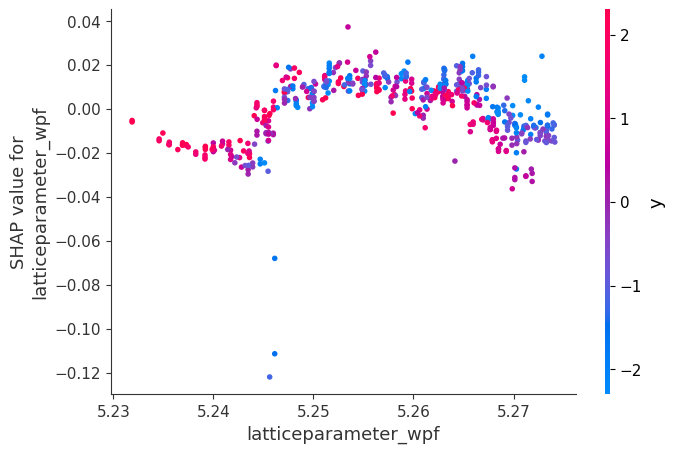

<Figure size 640x480 with 0 Axes>

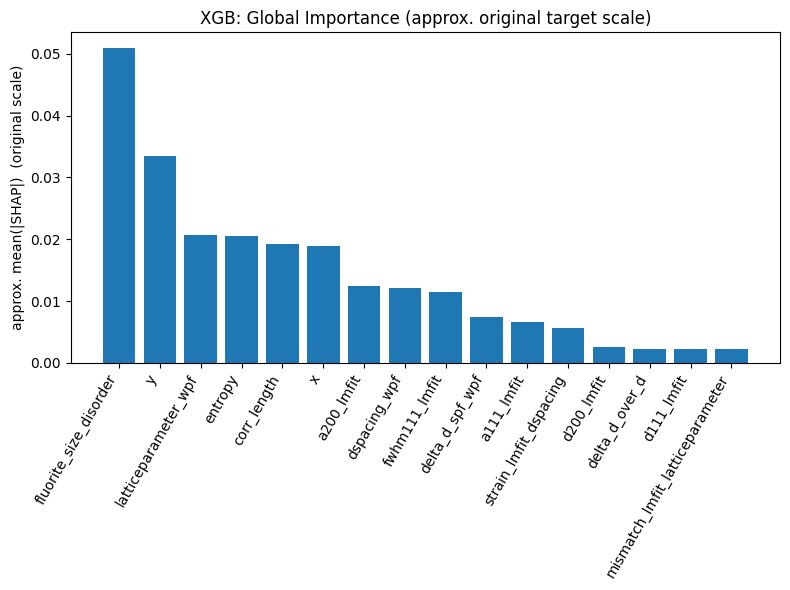

In [ ]:
# ==================== SHAP for Robust XGBoost (log-target) ====================
# Works with your pipeline:
#  - LogTargetRegressor(Pipeline(impute -> XGBRegressor))
#  - Rebuilds matrices using the exact feature columns used for training

import numpy as np, matplotlib.pyplot as plt, warnings
warnings.filterwarnings("ignore", category=UserWarning)

# 0) deps
try:
    import shap
except Exception as e:
    raise ImportError("SHAP not installed. Run: pip install shap") from e

# 1) sanity checks
assert "xgb_log" in globals(), "Train xgb_log first."
assert "df_model" in globals(), "df_model not found."
assert "present_xy" in globals(), "present_xy (feature list) not found."
assert "idx_trn" in globals() and "idx_val" in globals(), "Need idx_trn/idx_val from your split."

# 2) unwrap fitted inner pipeline and model
inner_pipe = getattr(xgb_log, "reg_", xgb_log)
if hasattr(inner_pipe, "named_steps"):
    imputer = inner_pipe.named_steps.get("impute", None)
    model   = inner_pipe.named_steps.get("model", None)
else:
    imputer, model = None, inner_pipe
assert hasattr(model, "predict"), "Could not locate the fitted XGBRegressor."

# 3) rebuild matrices with the exact columns the model used (order preserved)
feature_names_X = list(df_model[present_xy].columns)  # keep this for later use too
X_trn_fixed = df_model.iloc[idx_trn][feature_names_X].to_numpy(np.float32)
X_val_fixed = df_model.iloc[idx_val][feature_names_X].to_numpy(np.float32)

# impute using the trained imputer (shape must match training)
X_trn_imp = imputer.transform(X_trn_fixed) if imputer is not None else X_trn_fixed
X_val_imp = imputer.transform(X_val_fixed) if imputer is not None else X_val_fixed

# 4) sample for SHAP speed
rng = np.random.RandomState(42)
BG_N      = min(400, len(X_trn_imp))   # background
EXPLAIN_N = min(800, len(X_val_imp))   # points to explain
bg_idx    = rng.choice(len(X_trn_imp), size=BG_N, replace=False)
val_idx   = rng.choice(len(X_val_imp), size=EXPLAIN_N, replace=False)
X_bg      = X_trn_imp[bg_idx]
X_exp     = X_val_imp[val_idx]

# 5) compute SHAP (prefer TreeExplainer; fallback to model-agnostic)
try:
    expl = shap.TreeExplainer(model)
    shap_vals = expl.shap_values(X_exp)      # (n, d) in log-target space
    sv_obj = None
except Exception:
    expl = shap.Explainer(model, X_bg, feature_names=feature_names_X)
    sv_obj = expl(X_exp)                      # shap.Explanation
    shap_vals = sv_obj.values                 # (n, d)

feat_names = feature_names_X

# 6) global importance (log-target space)
imp   = np.mean(np.abs(shap_vals), axis=0)
order = np.argsort(imp)[::-1]
top_k = min(20, len(feat_names))

print("Top features by mean(|SHAP|) in log-target space:")
for i in range(top_k):
    print(f"{i+1:2d}. {feat_names[order[i]]}: {imp[order[i]]:.5g}")

plt.figure(figsize=(8,6))
plt.bar(range(top_k), imp[order][:top_k])
plt.xticks(range(top_k), [feat_names[i] for i in order[:top_k]], rotation=60, ha="right")
plt.ylabel("mean(|SHAP|)  (log-target space)")
plt.title("XGB: Global Feature Importance (log scale)")
plt.tight_layout(); plt.savefig("shap_global_bar_log.png", dpi=160); plt.show()

# 7) beeswarm (distribution of SHAP impacts)
try:
    if sv_obj is not None:
        shap.plots.beeswarm(sv_obj, max_display=20, show=True)
    else:
        raise RuntimeError()
except Exception:
    shap.summary_plot(shap_vals, X_exp, feature_names=feat_names, max_display=20, show=True)
plt.gcf().savefig("shap_beeswarm.png", dpi=160, bbox_inches="tight")

# 8) dependence plots for top 3
for i in range(min(3, len(order))):
    fidx = order[i]
    try:
        if sv_obj is not None:
            shap.plots.scatter(sv_obj[:, fidx], show=True)
        else:
            raise RuntimeError()
    except Exception:
        shap.dependence_plot(fidx, shap_vals, X_exp, feature_names=feat_names, show=True)
    plt.gcf().savefig(f"shap_dependence_{feat_names[fidx]}.png", dpi=160, bbox_inches="tight")

# 9) (optional) approximate original-scale importance
# The model learned log1p(y). SHAP is in log space; rescale via chain rule for intuition.
try:
    y_log_hat = model.predict(X_exp)          # log space output
    scale     = np.exp(y_log_hat)             # dy/d(log y) ~ exp(log y) = y
    shap_vals_orig = shap_vals * scale[:, None]
    imp_o   = np.mean(np.abs(shap_vals_orig), axis=0)
    order_o = np.argsort(imp_o)[::-1]

    plt.figure(figsize=(8,6))
    plt.bar(range(top_k), imp_o[order_o][:top_k])
    plt.xticks(range(top_k), [feat_names[i] for i in order_o[:top_k]], rotation=60, ha="right")
    plt.ylabel("approx. mean(|SHAP|)  (original scale)")
    plt.title("XGB: Global Importance (approx. original target scale)")
    plt.tight_layout(); plt.savefig("shap_global_bar_original_approx.png", dpi=160); plt.show()
except Exception as e:
    print("Skipped original-scale SHAP bar:", repr(e))
